# Part 3 - Thresholding

### Let's apply combinations of color and gradient thresholds to generate a binary image where the lane lines are clearly visible.

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

# Read in the saved camera matrix and distortion coefficients
# These are the arrays we calculated using cv2.calibrateCamera()
dist_pickle = pickle.load( open( "camera_cal/camera_cal_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in the saved perspective transformation matrices
# These are the arrays we calculated using cv2.getPerspectiveTransform()
dist_pickle = pickle.load( open( "camera_cal/perspective_trans_matrices.p", "rb" ) )
M = dist_pickle["M"]
Minv = dist_pickle["Minv"]

### Test camera calibration

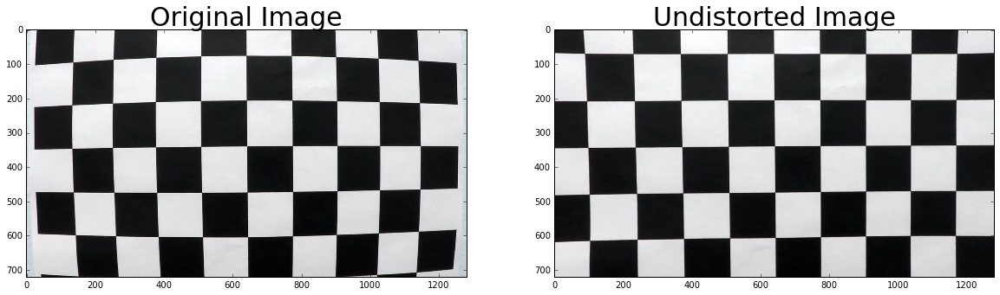

In [2]:
# Read and undistort image test
img = cv2.imread('camera_cal/test_image/test_image2.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_image/test_undist2.jpg',dst)

#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

### Test perspective transformation

(720, 1280, 3)


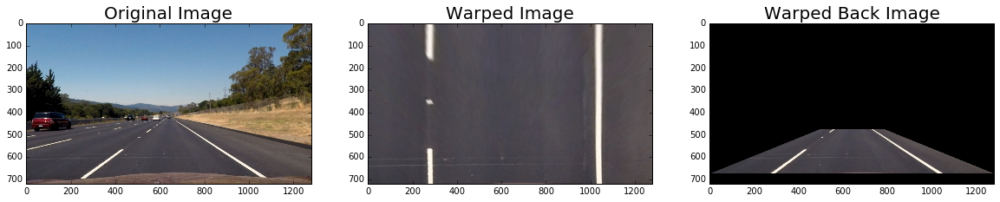

In [2]:
# load image
img = cv2.imread('test_images/straight_lines2.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)

# undistort and get size
img = cv2.undistort(img, mtx, dist, None, mtx)
img_size = (img.shape[1], img.shape[0])

# transform image
warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

# transform it back
warped_back = cv2.warpPerspective(warped, Minv, img_size, flags=cv2.INTER_LINEAR)
    
# Visualize it
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=20)
ax2.imshow(warped)
ax2.set_title('Warped Image', fontsize=20)
ax3.imshow(warped_back)
ax3.set_title('Warped Back Image', fontsize=20)

### Let's start on the thresholding. First with sobel gradients.

In [3]:
import glob

# Make a list of images
images = glob.glob('test_images/test*.jpg')
images.sort()

In [4]:
images

['test_images/test1.jpg',
 'test_images/test2.jpg',
 'test_images/test3.jpg',
 'test_images/test4.jpg',
 'test_images/test5.jpg',
 'test_images/test6.jpg']

In [5]:
# Enlarge Inline Pictures
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = "14, 8" # or  whatever you want

This image is: <class 'numpy.ndarray'> with dimesions: (720, 1280, 3)


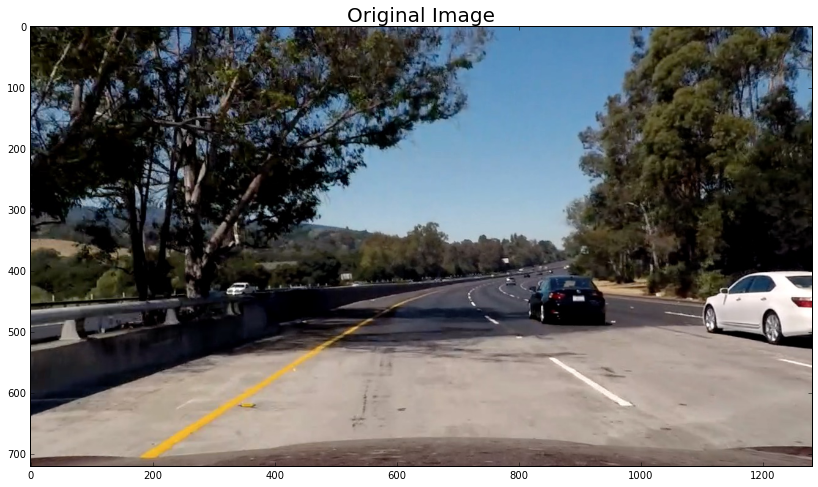

In [6]:
#reading in an image
img = cv2.imread(images[4])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.undistort(img, mtx, dist, None, mtx)
img_size = (img.shape[1], img.shape[0])
#printing out some stats and plotting
print('This image is:', type(img), 'with dimesions:', img.shape)

# Display Image
f, ax = plt.subplots(1, sharex=True, figsize=(14,1*8.7))
f.subplots_adjust(hspace=0.2, wspace=0.05)
plt.imshow(img)
ax.set_title('Original Image', fontsize=20)

### Let's explore the HLS color space.

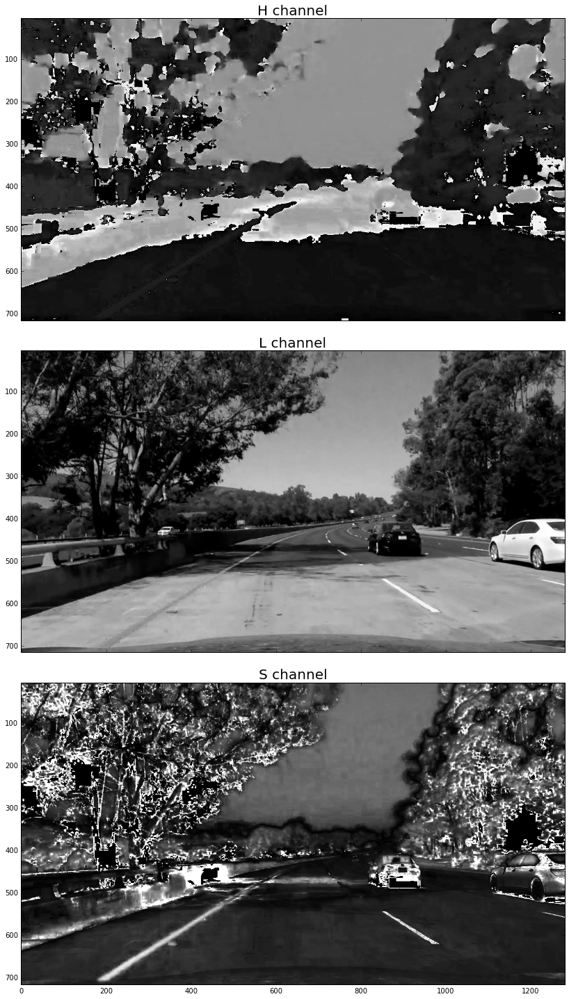

In [7]:
# HLS color space

hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

# Display Images
f, axarr = plt.subplots(3, sharex=True, figsize=(14,3*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(H, cmap='gray') 
axarr[0].set_title('H channel', fontsize=20)
axarr[1].imshow(L, cmap='gray') 
axarr[1].set_title('L channel', fontsize=20)
axarr[2].imshow(S, cmap='gray') 
axarr[2].set_title('S channel', fontsize=20)

### Let's explore Sobel absolute gradient X threshold.

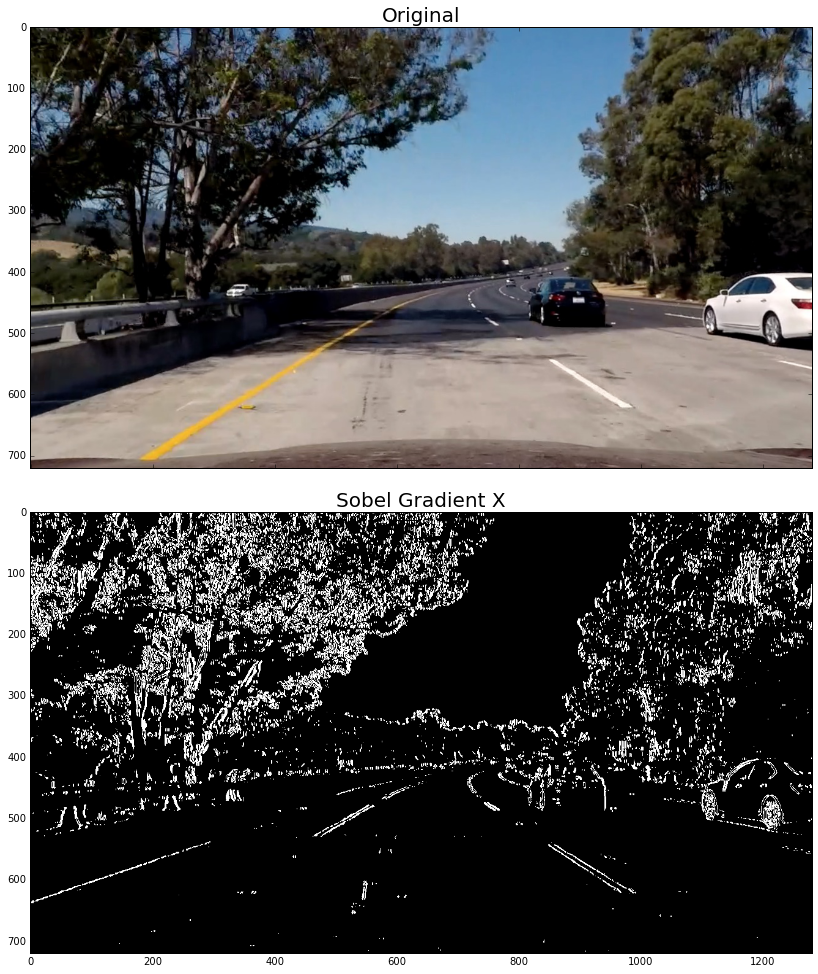

In [8]:
thresh_min=20
thresh_max=100
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# Apply x gradient with the OpenCV Sobel() function
# and take the absolute value
abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
# Rescale back to 8 bit integer
scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
# Create a copy and apply the threshold
binary_output = np.zeros_like(scaled_sobel)
# Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

# Display Images
f, axarr = plt.subplots(2, sharex=True, figsize=(14,2*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(binary_output, cmap='gray') 
axarr[1].set_title('Sobel Gradient X', fontsize=20)


### Combine Sobel gradient and HLS color thresholds:

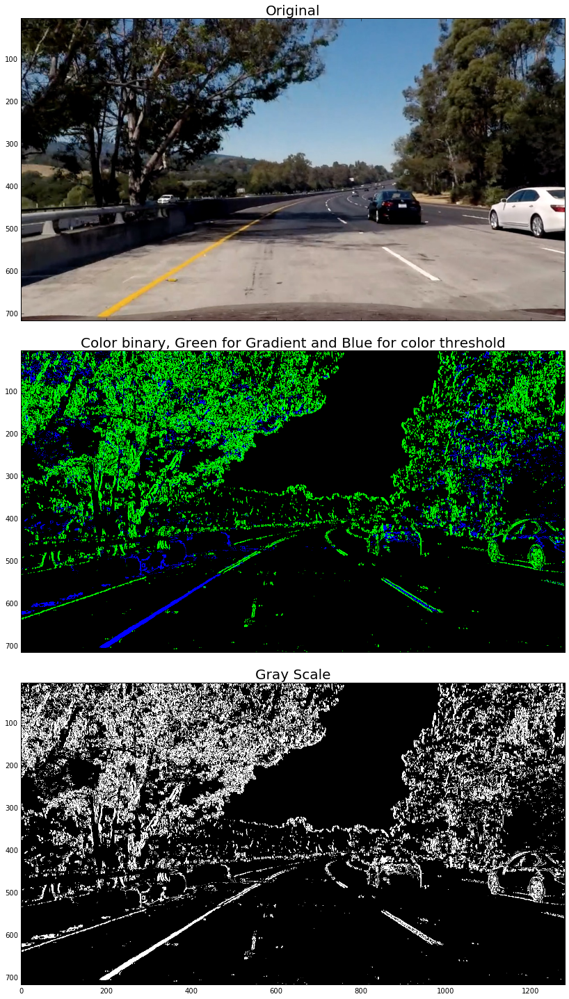

In [9]:
def thresholding(img, s_thresh=(170, 254), sx_thresh=(15, 100)): # 170,255 and 20,100
    img = np.copy(img)
    # Convert to HSL color space and separate the L channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    l_channel = hsv[:,:,1]
    s_channel = hsv[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
    combined = np.zeros_like(s_channel)
    combined[((s_binary == 1) | (sxbinary == 1))] = 1
    return color_binary, combined
    
color_binary, combined = thresholding(img)


# Display Images
f, axarr = plt.subplots(3, sharex=True, figsize=(14,3*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(color_binary, cmap=None) 
axarr[1].set_title('Color binary, Green for Gradient and Blue for color threshold', fontsize=20)
axarr[2].imshow(combined, cmap='gray') 
axarr[2].set_title('Gray Scale', fontsize=20)


### Test it on several road images.

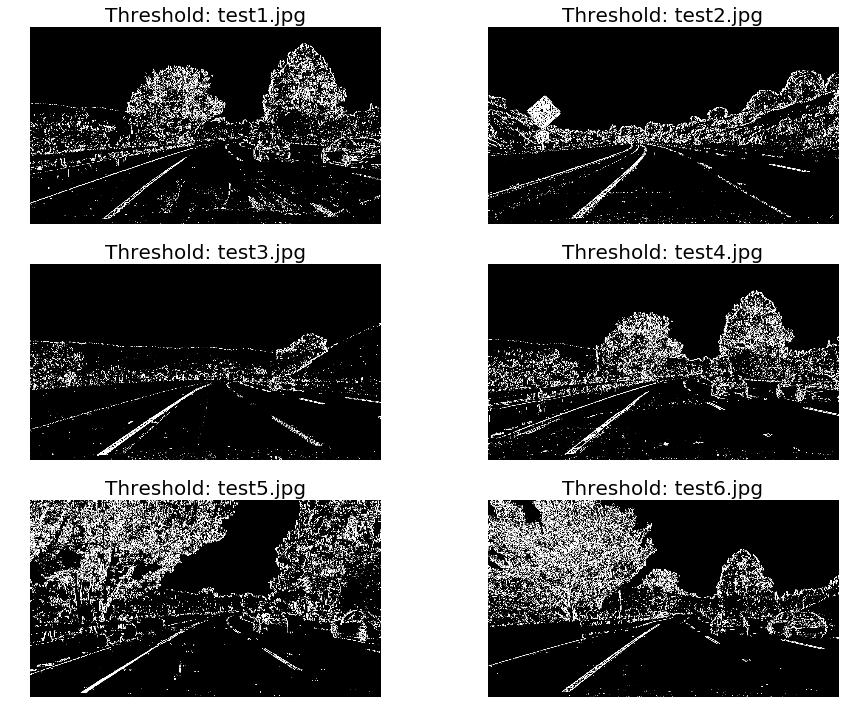

In [10]:
#  Plotting function for images
def plotImages_thresholdings(images, mtx, dist, ncols=1, cmap=None, prefix_label = 'label:'):
    """
    Plot images in a subplot arrangement.
    images = python list of images full path
    ncols = numbers of columns in the image plot arrangement
    prefix_label = prefix label to show on top of images
    """
    from os.path import basename
        
    nrows = int(np.ceil(len(images) / ncols))
    scalesize = nrows*ncols
    f, axarr = plt.subplots(nrows, ncols, figsize=(8*ncols, 4*nrows))
    f.subplots_adjust(hspace=0.2, wspace=0.05)
    axarr = axarr.flatten() # iterate on plots via 1D
    
    for idx, fname in enumerate(images):
        # load image, change color space, undistort
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.undistort(img, mtx, dist, None, mtx)       

        # Apply threshold
        color_binary, combined = thresholding(img)
        
        axarr[idx].axis('off')
        axarr[idx].imshow(combined, cmap=cmap)
        axarr[idx].set_title(prefix_label + ' ' + basename(images[idx]), fontsize=20)

        
plotImages_thresholdings(images, mtx, dist, ncols=2, cmap='gray', prefix_label = 'Threshold:')

### Let's apply perspective transformation on a test image.

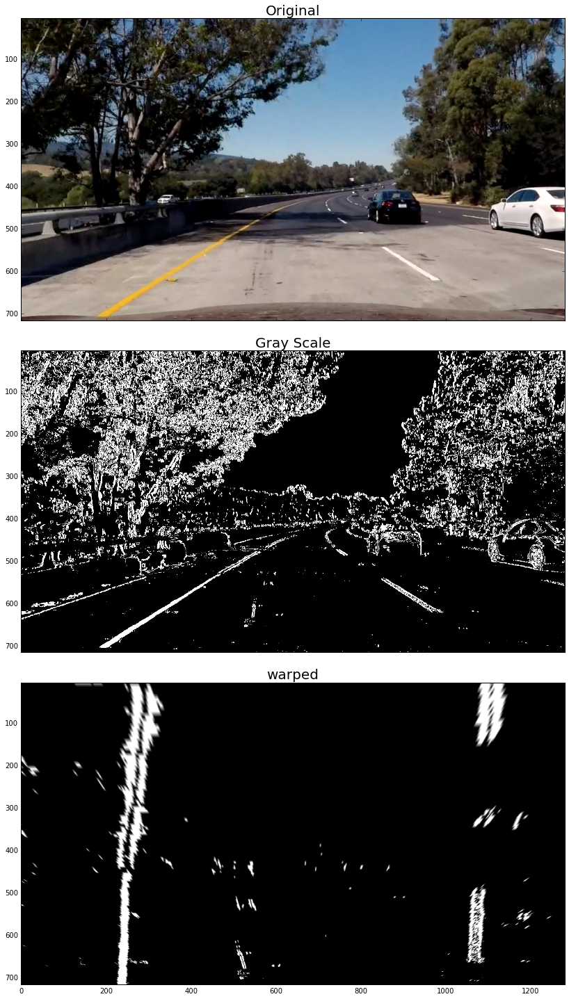

In [11]:
# Apply threshold
color_binary, combined = thresholding(img)

# transform image
warped = cv2.warpPerspective(combined, M, img_size, flags=cv2.INTER_LINEAR)

# Display Images
f, axarr = plt.subplots(3, sharex=True, figsize=(14,3*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(combined, cmap='gray') 
axarr[1].set_title('Gray Scale', fontsize=20)
axarr[2].imshow(warped, cmap='gray') 
axarr[2].set_title('warped', fontsize=20)

### Now let's apply it several test images.

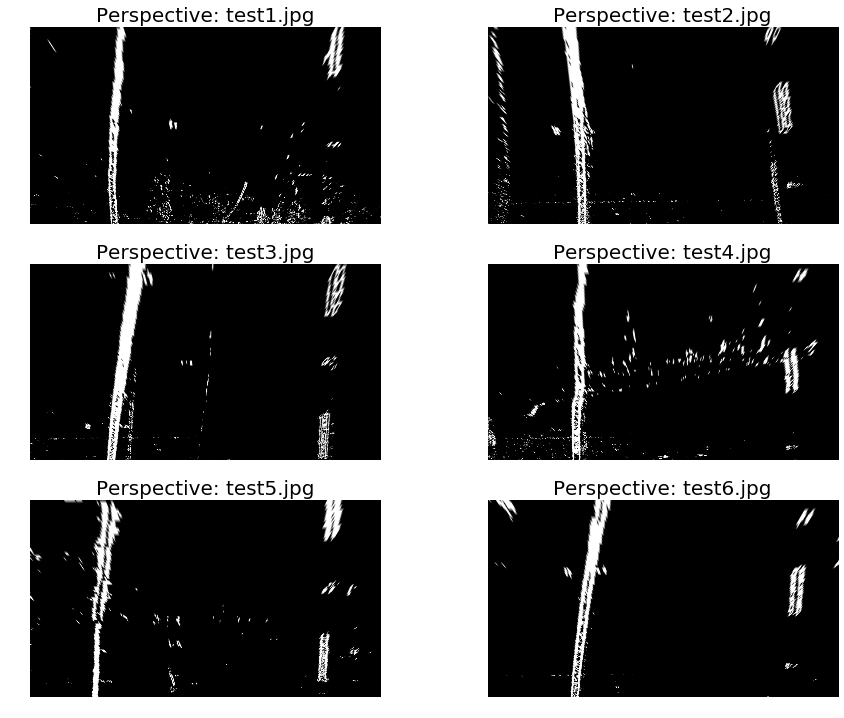

In [12]:
#  Plotting function for images
def plotImages_perspective(images, mtx, dist, M, ncols=1, cmap=None, prefix_label = 'label:'):
    """
    Plot images in a subplot arrangement.
    images = python list of images full path
    ncols = numbers of columns in the image plot arrangement
    prefix_label = prefix label to show on top of images
    """
    from os.path import basename
    
    nrows = int(np.ceil(len(images) / ncols))
    scalesize = nrows*ncols
    f, axarr = plt.subplots(nrows, ncols, figsize=(8*ncols, 4*nrows))
    f.subplots_adjust(hspace=0.2, wspace=0.05)
    axarr = axarr.flatten() # iterate on plots via 1D
    
    for idx, fname in enumerate(images):
        # load image, change color space, undistort, get sizes
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.undistort(img, mtx, dist, None, mtx)       
        img_size = (img.shape[1], img.shape[0])
        
        # Apply threshold
        color_binary, combined = thresholding(img)

        # transform image
        warped = cv2.warpPerspective(combined, M, img_size, flags=cv2.INTER_LINEAR)
        
        axarr[idx].axis('off')
        axarr[idx].imshow(warped, cmap=cmap)
        axarr[idx].set_title(prefix_label + ' ' + basename(images[idx]), fontsize=20)

        
plotImages_perspective(images, mtx, dist, M, ncols=2, cmap='gray', prefix_label = 'Perspective:')

### Let's try another method based on first detection project

In [13]:
def grayscale(img):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def filter_WhiteYellow(image):
    """
    Filter the image, showing only a range of white and yellow
    """
    # Filter White
    threshold = 200 
    high_threshold = np.array([255, 255, 255]) #Bright white
    low_threshold = np.array([threshold, threshold, threshold]) #Soft White
    mask = cv2.inRange(image, low_threshold, high_threshold)
    white_img = cv2.bitwise_and(image, image, mask=mask)

    # Filter Yellow
    hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV) #Changing Color-space, HSV is better for object detection
    #For HSV, Hue range is [0,179], Saturation range is [0,255] and Value range is [0,255]. 
    high_threshold = np.array([110,255,255]) #Bright Yellow
    low_threshold = np.array([90,100,100]) #Soft Yellow   
    mask = cv2.inRange(hsv_img, low_threshold, high_threshold)
    yellow_img = cv2.bitwise_and(image, image, mask=mask)

    # Combine the two above images
    filtered_img = cv2.addWeighted(white_img, 1., yellow_img, 1., 0.)

    return filtered_img

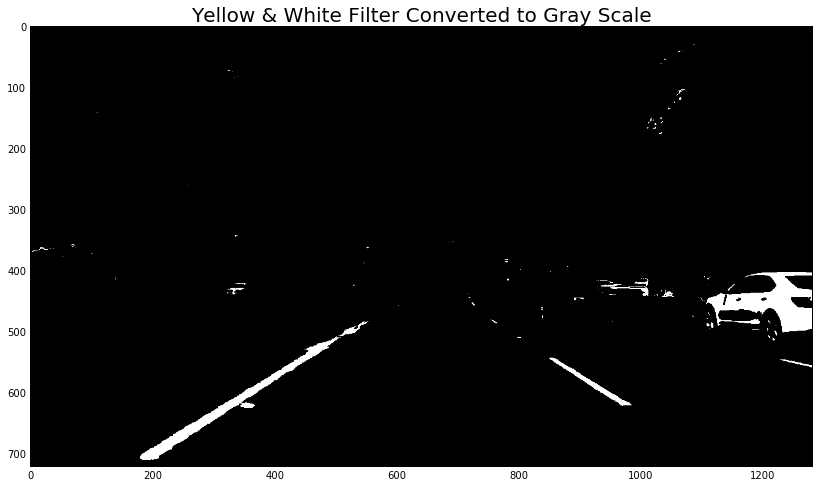

In [14]:
# Filter white and Yellow to make it easier for more accurate Canny detection
filtered_img = filter_WhiteYellow(img)
# Convert image to gray scale
gray = grayscale(filtered_img)
binary_output2 = np.zeros_like(gray)
binary_output2[(gray > 0)] = 1

# Display Image
f, ax = plt.subplots(1, sharex=True, figsize=(14,1*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
plt.imshow(binary_output2, cmap='gray') 
ax.set_title('Yellow & White Filter Converted to Gray Scale', fontsize=20)

### Let's see how it looks like on transformed images

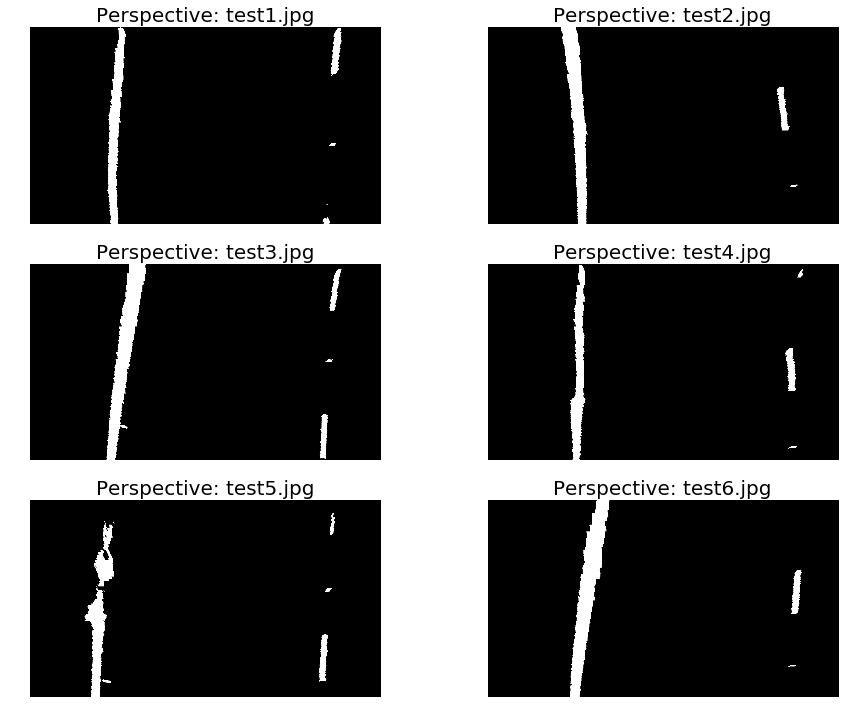

In [15]:
#  Plotting function for images
def plotImages_perspective2(images, mtx, dist, M, ncols=1, cmap=None, prefix_label = 'label:'):
    """
    Plot images in a subplot arrangement.
    images = python list of images full path
    ncols = numbers of columns in the image plot arrangement
    prefix_label = prefix label to show on top of images
    """
    from os.path import basename
    
    nrows = int(np.ceil(len(images) / ncols))
    scalesize = nrows*ncols
    f, axarr = plt.subplots(nrows, ncols, figsize=(8*ncols, 4*nrows))
    f.subplots_adjust(hspace=0.2, wspace=0.05)
    axarr = axarr.flatten() # iterate on plots via 1D
    
    for idx, fname in enumerate(images):
        # load image, change color space, undistort, get sizes
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.undistort(img, mtx, dist, None, mtx)       
        img_size = (img.shape[1], img.shape[0])
        
        # Apply Yellow & White Filter
        filtered_img = filter_WhiteYellow(img)
        gray = grayscale(filtered_img)
        binary_output2 = np.zeros_like(gray)
        binary_output2[(gray > 0)] = 1

        # transform image
        warped = cv2.warpPerspective(binary_output2, M, img_size, flags=cv2.INTER_LINEAR)
        
        axarr[idx].axis('off')
        axarr[idx].imshow(warped, cmap=cmap)
        axarr[idx].set_title(prefix_label + ' ' + basename(images[idx]), fontsize=20)

        
plotImages_perspective2(images, mtx, dist, M, ncols=2, cmap='gray', prefix_label = 'Perspective:')

### Let's try to combine Sobel gradient and Yello/White filter

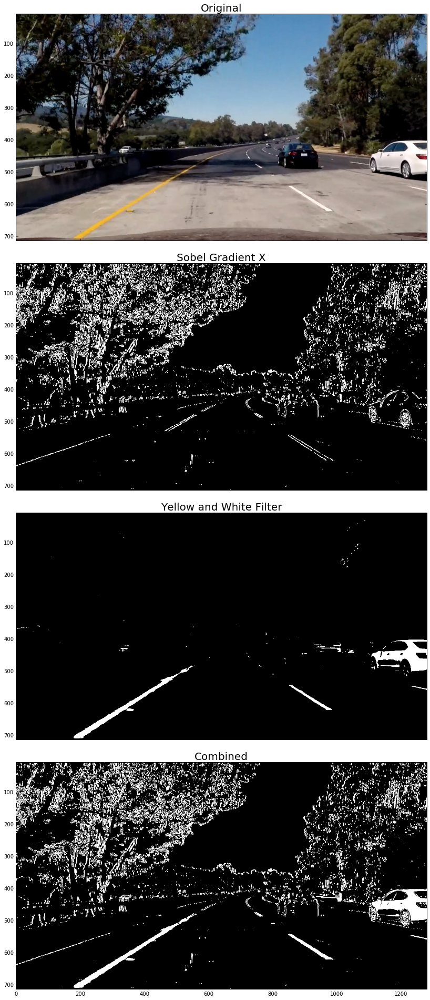

In [16]:
thresh_min=20
thresh_max=100
# Convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
# Apply x gradient with the OpenCV Sobel() function
# and take the absolute value
abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
# Rescale back to 8 bit integer
scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
# Create a copy and apply the threshold
binary_output = np.zeros_like(scaled_sobel)
# Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1


# Filter white and Yellow to make it easier for more accurate Canny detection
filtered_img = filter_WhiteYellow(img)
# Convert image to gray scale
gray = grayscale(filtered_img)
binary_output2 = np.zeros_like(gray)
binary_output2[(gray > 0)] = 1

combined = np.zeros_like(binary_output)
combined[((binary_output2 == 1) | (binary_output == 1))] = 1

# Display Images
f, axarr = plt.subplots(4, sharex=True, figsize=(14,4*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(binary_output, cmap='gray') 
axarr[1].set_title('Sobel Gradient X', fontsize=20)
axarr[2].imshow(binary_output2, cmap='gray') 
axarr[2].set_title('Yellow and White Filter', fontsize=20)
axarr[3].imshow(combined, cmap='gray') 
axarr[3].set_title('Combined', fontsize=20)

### Now we try it on several test images

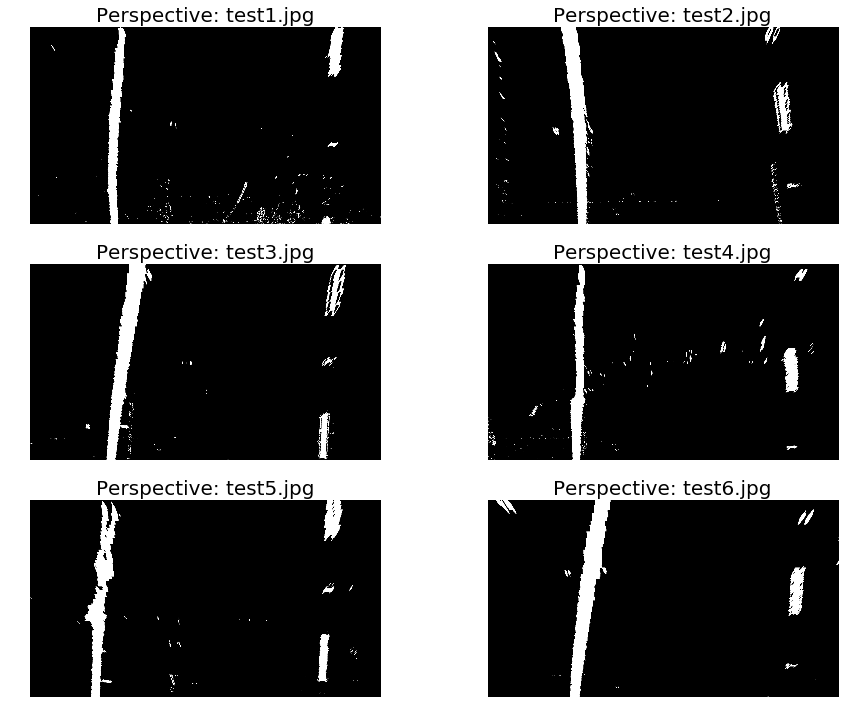

In [17]:
#  Plotting function for images
def plotImages_perspective3(images, mtx, dist, M, ncols=1, cmap=None, prefix_label = 'label:'):
    """
    Plot images in a subplot arrangement.
    images = python list of images full path
    ncols = numbers of columns in the image plot arrangement
    prefix_label = prefix label to show on top of images
    """
    from os.path import basename
    
    nrows = int(np.ceil(len(images) / ncols))
    scalesize = nrows*ncols
    f, axarr = plt.subplots(nrows, ncols, figsize=(8*ncols, 4*nrows))
    f.subplots_adjust(hspace=0.2, wspace=0.05)
    axarr = axarr.flatten() # iterate on plots via 1D
    
    for idx, fname in enumerate(images):
        # load image, change color space, undistort, get sizes
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.undistort(img, mtx, dist, None, mtx)       
        img_size = (img.shape[1], img.shape[0])
        
        # Sobel gradient X
        thresh_min=20
        thresh_max=100
        # Convert to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        # Apply x gradient with the OpenCV Sobel() function
        # and take the absolute value
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
        # Rescale back to 8 bit integer
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        # Create a copy and apply the threshold
        binary_output = np.zeros_like(scaled_sobel)
        # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
        binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
        
        # Apply Yellow & White Filter
        filtered_img = filter_WhiteYellow(img)
        gray = grayscale(filtered_img)
        binary_output2 = np.zeros_like(gray)
        binary_output2[(gray > 0)] = 1
        
        # Combne it
        combined = np.zeros_like(binary_output)
        combined[((binary_output2 == 1) | (binary_output == 1))] = 1

        # transform image
        warped = cv2.warpPerspective(combined, M, img_size, flags=cv2.INTER_LINEAR)
        
        axarr[idx].axis('off')
        axarr[idx].imshow(warped, cmap=cmap)
        axarr[idx].set_title(prefix_label + ' ' + basename(images[idx]), fontsize=20)

        
plotImages_perspective3(images, mtx, dist, M, ncols=2, cmap='gray', prefix_label = 'Perspective:')

### Here is the pipeline using combined gradient and color threshold

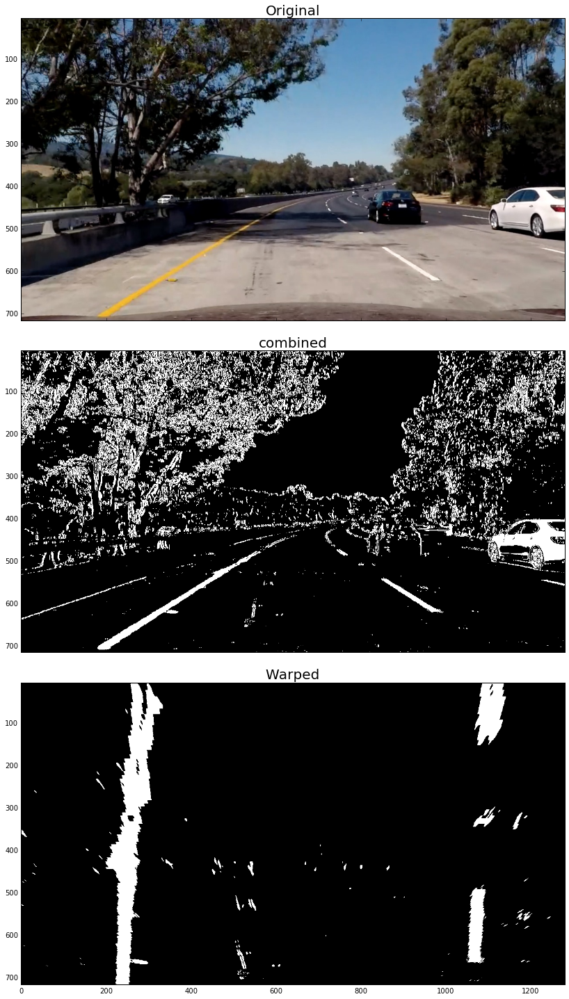

In [19]:

def pipeline_thresholding2(img, M, img_size, sx_thresh=(15, 100)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x gradient with the OpenCV Sobel() function
    # and take the absolute value
    abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1


    # Filter white and Yellow to make it easier for more accurate Canny detection
    filtered_img = filter_WhiteYellow(img)
    # Convert image to gray scale
    gray = grayscale(filtered_img)
    binary_output2 = np.zeros_like(gray)
    binary_output2[(gray > 0)] = 1

    combined = np.zeros_like(binary_output)
    combined[((binary_output2 == 1) | (binary_output == 1))] = 1
    
    warped = cv2.warpPerspective(combined, M, img_size, flags=cv2.INTER_LINEAR)

    return warped, combined

warped, combined = pipeline_thresholding2(img, M, img_size)


# Display Images
f, axarr = plt.subplots(3, sharex=True, figsize=(14,3*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(combined, cmap='gray') 
axarr[1].set_title('combined', fontsize=20)
axarr[2].imshow(warped, cmap='gray') 
axarr[2].set_title('Warped', fontsize=20)

### Here is the pipeline using only Yellow & White filter which in my opinon is doing a great job with less computation

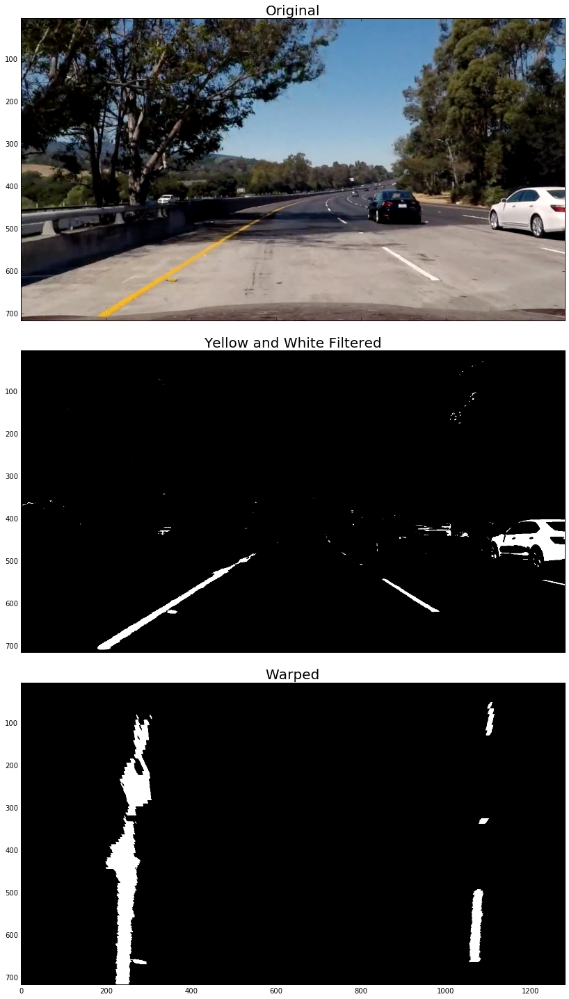

In [22]:

def pipeline_thresholding3(img, M, img_size):

    # Filter white and Yellow to make it easier for more accurate Canny detection
    filtered_img = filter_WhiteYellow(img)
    # Convert image to gray scale
    gray = grayscale(filtered_img)
    binary_output2 = np.zeros_like(gray)
    binary_output2[(gray > 0)] = 1
    
    warped = cv2.warpPerspective(binary_output2, M, img_size, flags=cv2.INTER_LINEAR)

    return warped, binary_output2

warped, binary_output2 = pipeline_thresholding3(img, M, img_size)


# Display Images
f, axarr = plt.subplots(3, sharex=True, figsize=(14,3*8.3))
f.subplots_adjust(hspace=0.1, wspace=0.05)
axarr[0].imshow(img, cmap=None) 
axarr[0].set_title('Original', fontsize=20)
axarr[1].imshow(binary_output2, cmap='gray') 
axarr[1].set_title('Yellow and White Filtered', fontsize=20)
axarr[2].imshow(warped, cmap='gray') 
axarr[2].set_title('Warped', fontsize=20)